## First Steps with GeoPandas

In [7]:
%matplotlib inline
import geopandas as gpd
import requests, pandas as pd
import pandas as pd, geopandas as gpd

In [17]:

holi =pd.read_csv("holi.csv", encoding='utf-8')
holi=holi.set_index(['CVEGEO'])
#gto15= munpop[(munpop['ano']==2015) & (munpop['ent'] == 'Guanajuato')]
#gto15= mich15.groupby(['NOMGEO']).sum().reset_index()
#gto15.head(10000)
holi.head(5)

,year_x,ENTIDAD,MUNICIPIO,homicidios,pop,hom_rate,year_y,3x1 Projects Granted in 2013
CVEGEO,,,,,,,,
1001,2013.0,AGUASCALIENTES,AGUASCALIENTES,19.0,797010.0,2.383910,2013.0,6.0
1002,2013.0,AGUASCALIENTES,ASIENTOS,5.0,45492.0,10.990943,2013.0,2.0
1003,2013.0,AGUASCALIENTES,CALVILLO,0.0,54136.0,0.000000,2013.0,17.0
1004,2013.0,AGUASCALIENTES,COSIO,0.0,15042.0,0.000000,2013.0,2.0
1005,2013.0,AGUASCALIENTES,JESUS MARIA,7.0,99590.0,7.028818,NaN,NaN


In [19]:
geo_df = gpd.read_file("muni.shp")
geo_df.set_index(geo_df["CVEGEO"].astype(int), inplace = True)
geo_df.head(5)

,AREA,COV_,COV_ID,CVEGEO,CVE_CAB,CVE_ENT,CVE_MUN,NOM_CAB,NOM_ENT,NOM_MUN,PERIMETER,geometry
CVEGEO,,,,,,,,,,,,
1002,54337.426563,0.0,1.0,01002,0001,01,002,Asientos,Aguascalientes,Asientos,192096.427893,"POLYGON ((2500060.239199999 1133299.9901, 2500..."
1011,13777.017689,1.0,2.0,01011,0001,01,011,San Francisco de los Romo,Aguascalientes,San Francisco de los Romo,103689.065058,"POLYGON ((2485534.556000002 1117425.794000002,..."
1007,37229.516172,2.0,3.0,01007,0001,01,007,RincÃ³n de Romos,Aguascalientes,RincÃ³n de Romos,161749.880103,"POLYGON ((2480633.530000007 1149057.668199996,..."
1008,85779.057493,3.0,4.0,01008,0001,01,008,San JosÃ© de Gracia,Aguascalientes,San JosÃ© de Gracia,181537.600406,"POLYGON ((2463679.819099998 1122454.043300003,..."
1005,49989.510265,4.0,5.0,01005,0001,01,005,JesÃºs MarÃ­a,Aguascalientes,JesÃºs MarÃ­a,163500.813411,"POLYGON ((2468125.583600003 1113246.7959, 2468..."


In [20]:
merged = geo_df.join(holi, how = "inner")
merged.head(5)

,AREA,COV_,COV_ID,CVEGEO,CVE_CAB,CVE_ENT,CVE_MUN,NOM_CAB,NOM_ENT,NOM_MUN,PERIMETER,geometry,year_x,ENTIDAD,MUNICIPIO,homicidios,pop,hom_rate,year_y,3x1 Projects Granted in 2013
CVEGEO,,,,,,,,,,,,,,,,,,,,
1001,116635.923614,6.0,7.0,01001,0001,01,001,Aguascalientes,Aguascalientes,Aguascalientes,256631.024148,"POLYGON ((2489959.177600002 1111683.058800004,...",2013.0,AGUASCALIENTES,AGUASCALIENTES,19.0,797010.0,2.383910,2013.0,6.0
1002,54337.426563,0.0,1.0,01002,0001,01,002,Asientos,Aguascalientes,Asientos,192096.427893,"POLYGON ((2500060.239199999 1133299.9901, 2500...",2013.0,AGUASCALIENTES,ASIENTOS,5.0,45492.0,10.990943,2013.0,2.0
1003,92335.783202,9.0,10.0,01003,0001,01,003,Calvillo,Aguascalientes,Calvillo,171636.167073,"POLYGON ((2440783.883699994 1105688.003400005,...",2013.0,AGUASCALIENTES,CALVILLO,0.0,54136.0,0.000000,2013.0,17.0
1004,12838.354552,10.0,11.0,01004,0001,01,004,CosÃ­o,Aguascalientes,CosÃ­o,73352.681105,"POLYGON ((2474059.8709 1150395.9081, 2474143.2...",2013.0,AGUASCALIENTES,COSIO,0.0,15042.0,0.000000,2013.0,2.0
1005,49989.510265,4.0,5.0,01005,0001,01,005,JesÃºs MarÃ­a,Aguascalientes,JesÃºs MarÃ­a,163500.813411,"POLYGON ((2468125.583600003 1113246.7959, 2468...",2013.0,AGUASCALIENTES,JESUS MARIA,7.0,99590.0,7.028818,NaN,NaN


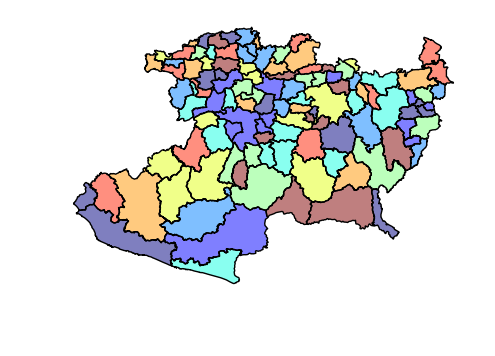

In [41]:

ax = geo_df.plot()
ax.set_axis_off()

In [23]:
ft = "3x1 Projects Granted in 2013"
ax = merged.plot(scheme = "EQUAL_INTERVAL", k = 9, column = ft, 
                                     figsize = (230, 120), legend = True, cmap = "Reds")
#ax.set_axis_off()

C:\Users\jmtor\Anaconda3\envs\p34-geo-new\lib\site-packages\pysal\esda\mapclassify.py:259: RuntimeWarning: invalid value encountered in greater
  binIds += (x > l) * (x <= r) * k
C:\Users\jmtor\Anaconda3\envs\p34-geo-new\lib\site-packages\pysal\esda\mapclassify.py:259: RuntimeWarning: invalid value encountered in less_equal
  binIds += (x > l) * (x <= r) * k
C:\Users\jmtor\Anaconda3\envs\p34-geo-new\lib\site-packages\numpy\lib\function_base.py:3569: RuntimeWarning: Invalid value encountered in median
  RuntimeWarning)


## Single Mothers by State

Download and format the state-by-state data; format the dataframe.  Set the State ID as the index as an integer, and rename the data column and cast it as a float.

In [7]:
gto15.head(5)

,NOMGEO,renglon,ano,id_ent,id_mun,cvegeo,pob
0,Abasolo,672555,20150,110,10,110010,88131.547542
1,AcÃ¡mbaro,674655,20150,110,20,110020,112516.175886
2,Apaseo el Alto,678855,20150,110,40,110040,68012.201259
3,Apaseo el Grande,680955,20150,110,50,110050,91627.249806
4,Atarjea,683055,20150,110,60,110060,5836.733598


## Pennsylvania Election Returns

* Import pandas and geopandas, and the democratic vote shares from the last election.
* See `Advanced.ipynb` for the (not actually very advanced) scraping from the PA elections site.

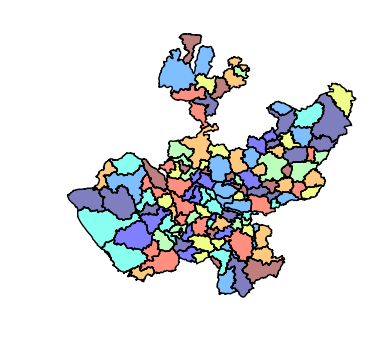

In [40]:
import pandas as pd, geopandas as gpd

geo_df = gpd.read_file("jal_municipio.shp")
geo_df.head(5)
geo_df.set_index(geo_df["NOMGEO"].astype(str), inplace = True)
reme = pd.read_csv("jalmun.csv", index_col = "NOMGEO")
reme.head()
merged = geo_df.join(reme, how = "inner")
merged.head(5)
ax = geo_df.plot()
ax.set_axis_off()

In [41]:
geo_df

,CVEGEO,CVE_ENT,CVE_MUN,NOMGEO,geometry
NOMGEO,,,,,
Tuxcacuesco,14106,14,106,Tuxcacuesco,"POLYGON ((-104.11080297 19.80687659999915, -10..."
Techaluta de Montenegro,14089,14,089,Techaluta de Montenegro,"POLYGON ((-103.56682225 20.14847693999912, -10..."
Pihuamo,14065,14,065,Pihuamo,"POLYGON ((-103.27368746 19.37322544999914, -10..."
Zacoalco de Torres,14119,14,119,Zacoalco de Torres,"POLYGON ((-103.59154048 20.34928525999915, -10..."
Tonalá,14101,14,101,Tonalá,"POLYGON ((-103.26286543 20.70445436999919, -10..."
Degollado,14033,14,033,Degollado,"POLYGON ((-102.08418562 20.56146693999916, -10..."
Tequila,14094,14,094,Tequila,"POLYGON ((-103.53763014 21.43685047999914, -10..."
Cuautitlán de García Barragán,14027,14,027,Cuautitlán de García Barragán,"POLYGON ((-104.16033158 19.64334045999913, -10..."
Tototlán,14105,14,105,Tototlán,"POLYGON ((-102.71788922 20.64853037999918, -10..."


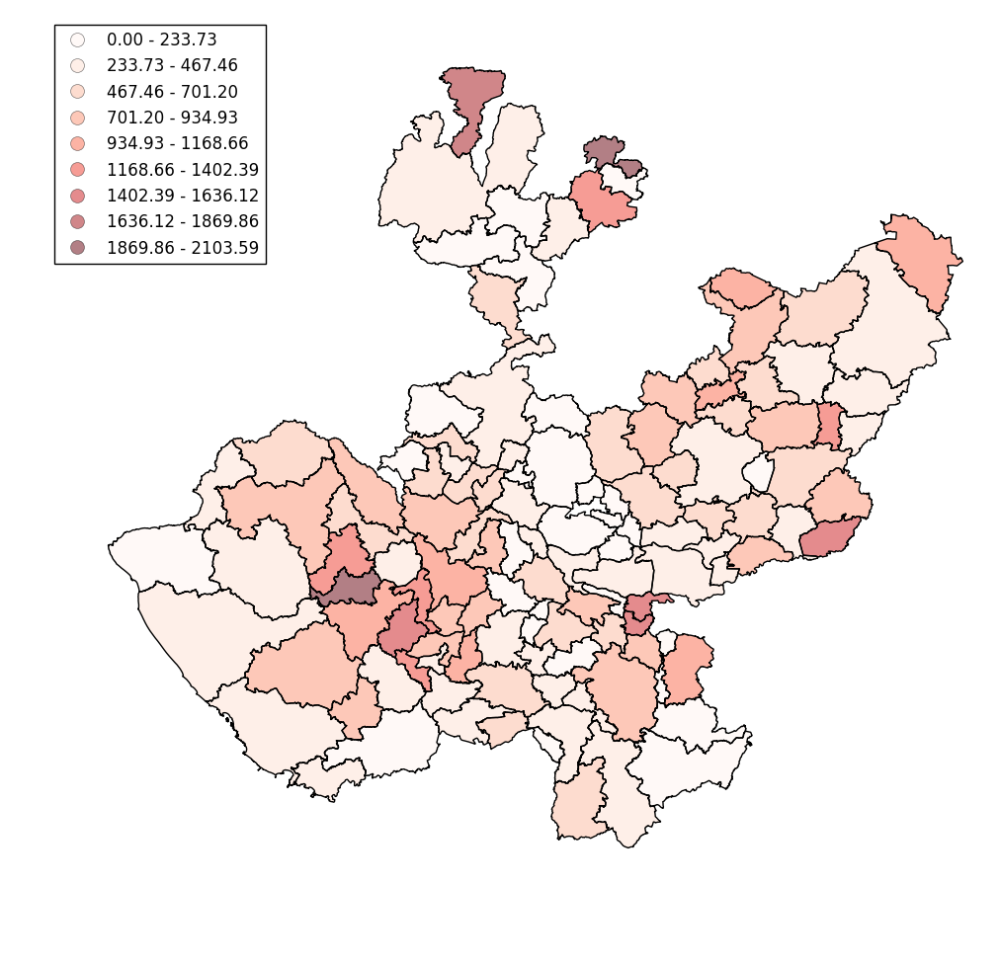

In [44]:
ft = "rate"
ax = merged.plot(scheme = "EQUAL_INTERVAL", k = 9, column = ft, 
                                     figsize = (23, 12), legend = True, cmap = "Reds")
ax.set_axis_off()

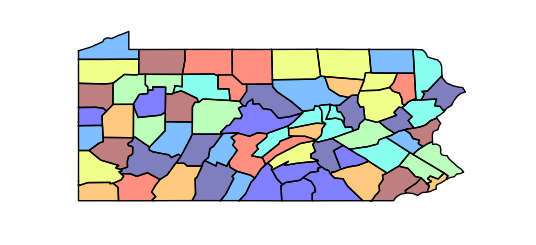

In [5]:
ax = counties.plot()
ax.set_axis_off()

* Let's again make a Choropleth map, this time with `equal_interval`.
* This time, an appropriate CRS is 3651, for southern Pennsylvania ([spatial reference](http://spatialreference.org/ref/epsg/3651/)).

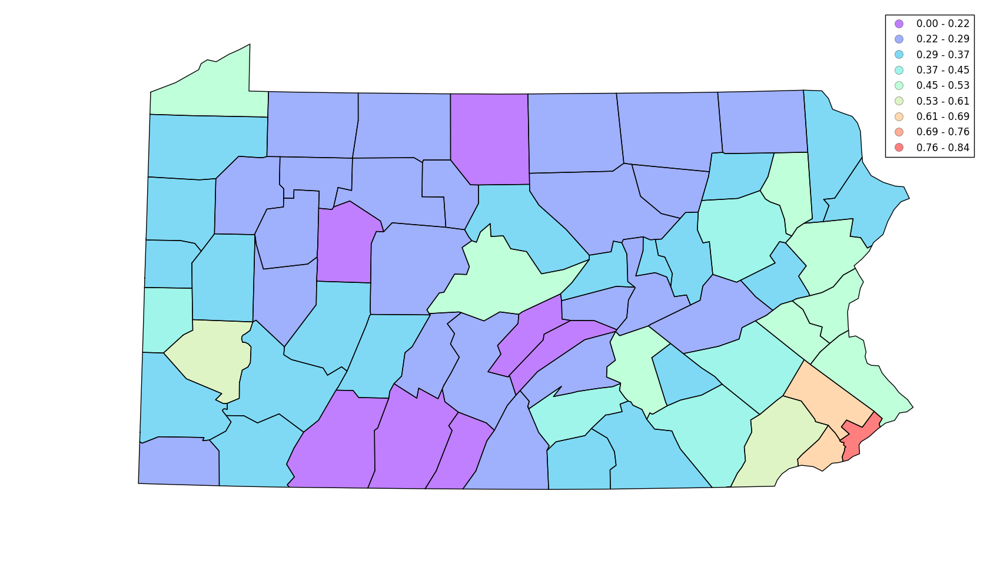

In [6]:
ft = "Democratic Two-Party Vote Share"
ax = merged.to_crs(epsg = 3651).plot(scheme = "EQUAL_INTERVAL", k = 9, column = ft, 
                                     figsize = (23, 12), legend = True, cmap = "rainbow")
ax.set_axis_off()

Here, as above, we download data frome the census.  This time, it's the percent of adults with a bachelor's degree, at the county level.

In [ ]:
import requests, pandas as pd
j = requests.get("http://api.census.gov/data/2014/acs5/profile?for=county:*&in=state:42&get=NAME,DP02_0067PE").json()
educ_df = pd.DataFrame(j[1:], columns = j[0])
educ_df["county"] = educ_df["NAME"].str.lower()
educ_df["county"] = educ_df["county"].str.replace(" county, pennsylvania", "")
educ_df.set_index("county", inplace = True)
educ_df["DP02_0067PE"] = educ_df["DP02_0067PE"].astype(float)
educ_df.rename(columns = {"DP02_0067PE" : "Bachelor's Degree"}, inplace = True)
educ_df.head()

### Merge and Plot Bachelor's v. Share
Note again, the merging key is fundamentally geographical, though we're doing it with attributes.

In [ ]:
merged = demvote_df.join(educ_df, how = "inner")
merged.plot(kind = "scatter", x = "Democratic Two-Party Vote Share", y = "Bachelor's Degree")

# Spatial Joins

### Census Tracts
Import the tracts for chicago

In [ ]:
tract_df = gpd.read_file("data/cb_2014_17_tract_500k.shp")
tract_df = tract_df[tract_df["COUNTYFP"] == "031"]

* Take a look at `first_degree_murders.csv`.
* There is no "geometry" column, but there _are_ latitudes and longitudes.
* Import it, and make the geometry.

In [ ]:
from shapely.geometry import Point

crime_df = pd.read_csv("first_degree_murders.csv", usecols = [19, 20])
crime_df.dropna(inplace = True)

geometry = [Point(xy) for xy in zip(crime_df.Longitude, crime_df.Latitude)]
crime_coords = gpd.GeoDataFrame(crime_df, crs = tract_df.crs, geometry=geometry)

located_crimes = gpd.sjoin(crime_coords, tract_df, how = 'left', op = 'within')

In [ ]:
located_crimes.plot()

In [ ]:
located_crimes.rename(columns = {"NAME" : "Census Tract", "index_right" : "Murders"}, inplace = True)

murder_tract_count = located_crimes.groupby("Census Tract").count()[["Murders"]]

In [ ]:
mapped_murders = pd.merge(tract_df, murder_tract_count, how = "inner", left_on = "NAME", right_index = True)
mapped_murders.plot(column = "Murders", k = 9, linewidth = 0)

### Again with Community Areas

In [ ]:
commu_df = gpd.read_file("community_areas.geojson")

In [ ]:
crime_coords = gpd.GeoDataFrame(crime_df, crs = commu_df.crs, geometry=geometry)
located_crimes = gpd.tools.sjoin(crime_coords, commu_df, how = 'left', op = 'within')

In [ ]:
located_crimes.rename(columns = {"index_right" : "Murders"}, inplace = True)
murder_area_count = located_crimes.groupby("community").count()[["Murders"]]

mapped_murders = pd.merge(commu_df, murder_area_count, how = "inner", left_on = "community", right_index = True)
ax = mapped_murders.plot(column = "Murders", k = 9, linewidth = 0)

ax.set_axis_off()

## Interactive Web Maps!?  AWESOME!!!

In [ ]:
import folium

m = folium.Map([39.828175, -98.5795], 
               tiles='cartodbpositron', 
               zoom_start=4, max_zoom=14, min_zoom=4)

ft = "Percent Mothers Unmarried"
cmap = folium.colormap.linear.YlOrRd.scale(geo_merge[ft].min(), geo_merge[ft].max())

folium.GeoJson(geo_merge,
               style_function=lambda feature: {
                'fillColor': cmap(feature['properties'][ft]),
                'fillOpacity' : 0.6,
                'weight' : 2, 'color' : 'black'
               }).add_to(m)

cmap.caption = 'Percent Children Born to Single Mothers'
cmap.add_to(m)

m.save("us_single_mothers.html")
m

## Spatial Associations and Geocoding

In [ ]:
from geopy.geocoders import Nominatim
geolocator = Nominatim()
location = geolocator.geocode("6021 S. Kimbark Ave, Chicago")
location

In [ ]:
from shapely.geometry import Point
pt = Point(-87.5940494865461, 41.7851555)

In [ ]:
state_df = gpd.read_file("data/cb_2015_us_state_20m.shp")
state_df[state_df.contains(pt)]["NAME"]

In [ ]:
tract_df = gpd.read_file("data/cb_2014_17_tract_500k.shp")
tract_df = tract_df[tract_df["COUNTYFP"] == "031"]
tract_df.head()

In [ ]:
geo_df[geo_df.contains(pt)]["NAME"]

## Mountain Maps

In [ ]:
import geopandas as gpd, folium

m = folium.Map([39.828175, -98.5795], tiles='stamenwatercolor', zoom_start = 1)

df = gpd.read_file("TM_WORLD_BORDERS_SIMPL-0.3.shp")

mountains = ["Aconcagua", "Mount Kosciuszko", "Mont Blanc, Chamonix", "Mount Everest", "Denali", "Mount Elbrus", "Puncak Jaya", "Mount Kilimanjaro", "Mount Vinson"]
mtn_df = gpd.tools.geocode(mountains, provider = "googlev3").to_crs(df.crs)

folium.GeoJson(gpd.sjoin(df, mtn_df, how = "inner", op = "contains"),
               style_function=lambda feature: {
                'fillColor': 'red', 'fillOpacity' : 0.6, 'weight' : 2, 'color' : 'black'
               }).add_to(m)

for xi, pt in mtn_df.iterrows():
    folium.RegularPolygonMarker(pt.geometry.coords[::][0][::-1], popup=pt.address, 
                        number_of_sides = 5, radius = 8, fill_color = "black", fill_opacity = 1.0).add_to(m)

m